# **PyTorch - ResNet50 object detection** - Use pretrained model (Transfer Learning)

In [4]:
import torch
import torchvision
from PIL import Image
import numpy as np
from io import BytesIO 
import requests
from torchvision import transforms as T
import matplotlib.pyplot as plt
import cv2
import random
%matplotlib inline

In [2]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

In [3]:
model.eval() # Pretrained model , et model to eval mode

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [10]:
# list of class names for the model
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [5]:
def get_prediction(img, threshold=0.5):
  transform = T.Compose([T.ToTensor()])
  img = transform(img)
  pred = model([img]) # list
  pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())] # If using GPU, you would have to add .cpu()
  pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())] # Bounding Boxes
  pred_score = list(pred[0]['scores'].detach().numpy())
  pred_t = [pred_score.index(x) for x in pred_score if x > threshold][-1]
  pred_box = pred_boxes[:pred_t+1]
  pred_class = pred_class[:pred_t+1]
  return pred_box, pred_class


In [6]:
from urllib.request import urlopen
def url_to_image(url, readFlag=cv2.IMREAD_COLOR):
  resp = urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype="uint8")
  image = cv2.imdecode(image, readFlag)
  return image

In [7]:
def object_detection(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3, url=False):
  if url:
    img = url_to_image(img_path) # url
  else:
    img = cv2.imread(img_path) # saved image
  
  boxes, pred_clas = get_prediction(img, threshold=threshold)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  for i in range(len(boxes)):
    r, g, b = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)) # Random Color
    cv2.rectangle(img, boxes[i][0], boxes[i][1], color=(r, g, b), thickness=rect_th) # Draw Rectangle with the coordinates
    cv2.putText(img, pred_clas[i], boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, text_size, (r, g, b), thickness=text_th)
  plt.figure(figsize=(15, 15))
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.show()


In [23]:
# download file
!wget https://www.pngarts.com/files/10/Cat-PNG-Transparent-Image.png -O cat.jpg

--2022-01-05 19:52:33--  https://www.pngarts.com/files/10/Cat-PNG-Transparent-Image.png
Resolving www.pngarts.com (www.pngarts.com)... 78.159.114.6
Connecting to www.pngarts.com (www.pngarts.com)|78.159.114.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/png]
Saving to: ‘cat.jpg’

cat.jpg                 [  <=>               ] 245.65K   558KB/s    in 0.4s    

2022-01-05 19:52:34 (558 KB/s) - ‘cat.jpg’ saved [251547]



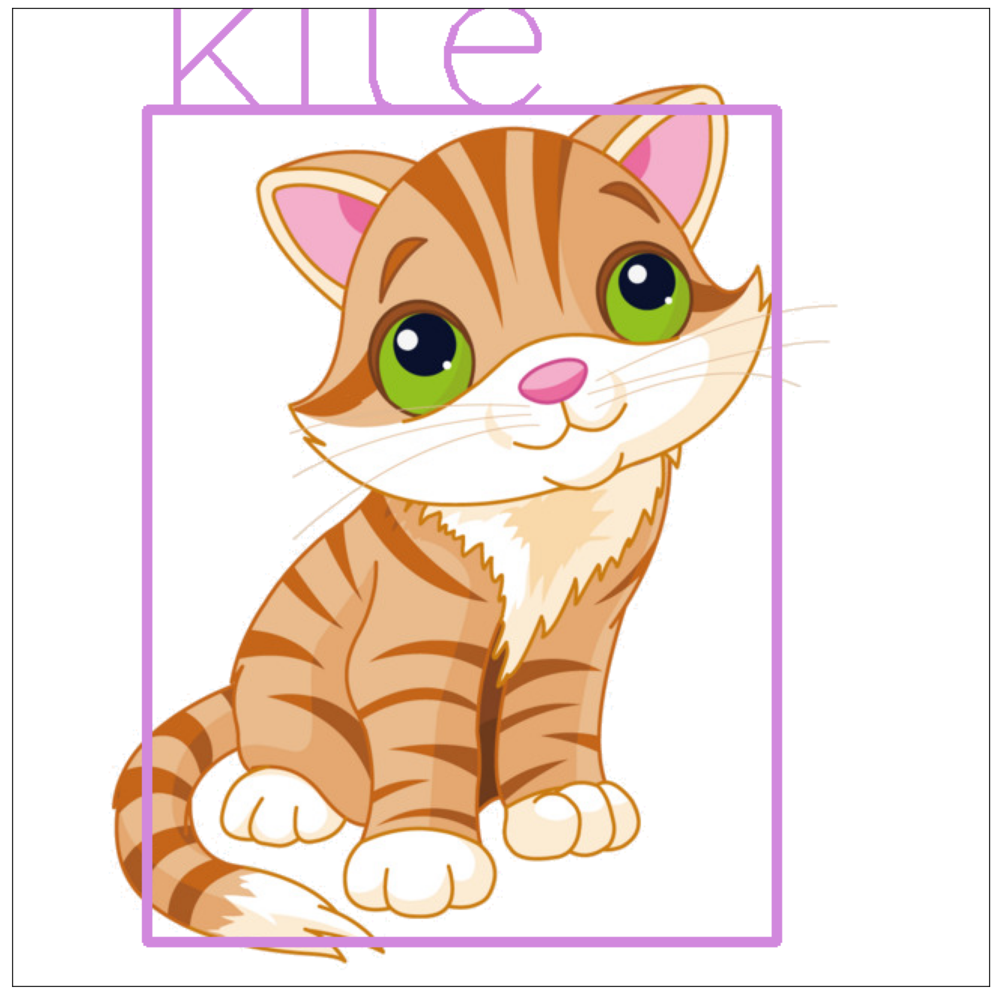

In [24]:
object_detection('./cat.jpg', rect_th=5, text_th=4, text_size=5)

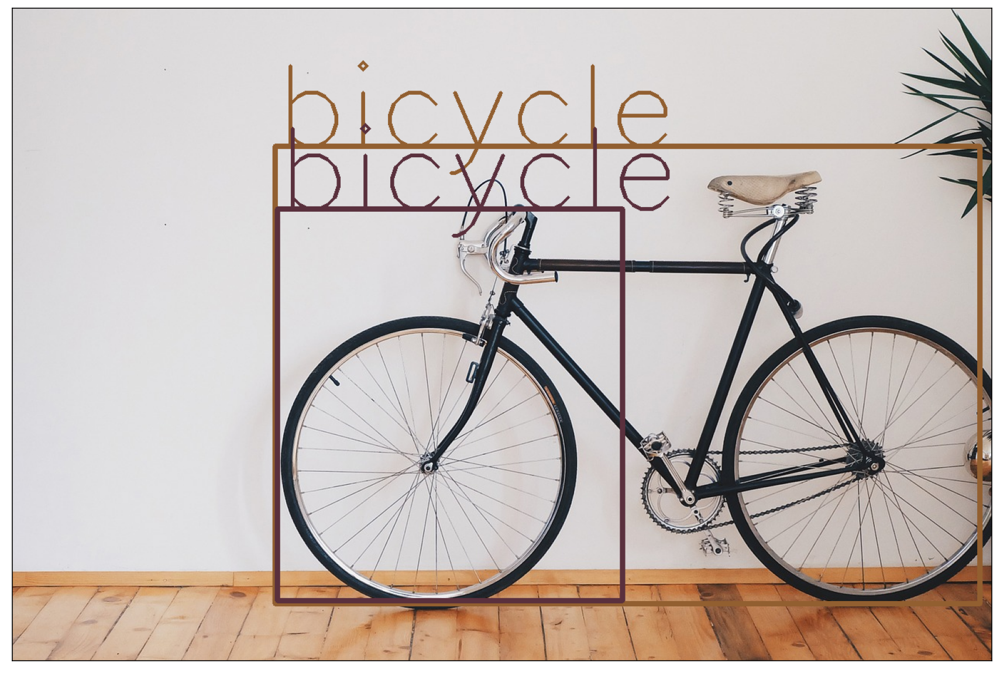

In [20]:
object_detection('./cycle.jpg', rect_th=5, text_th=4, text_size=5)

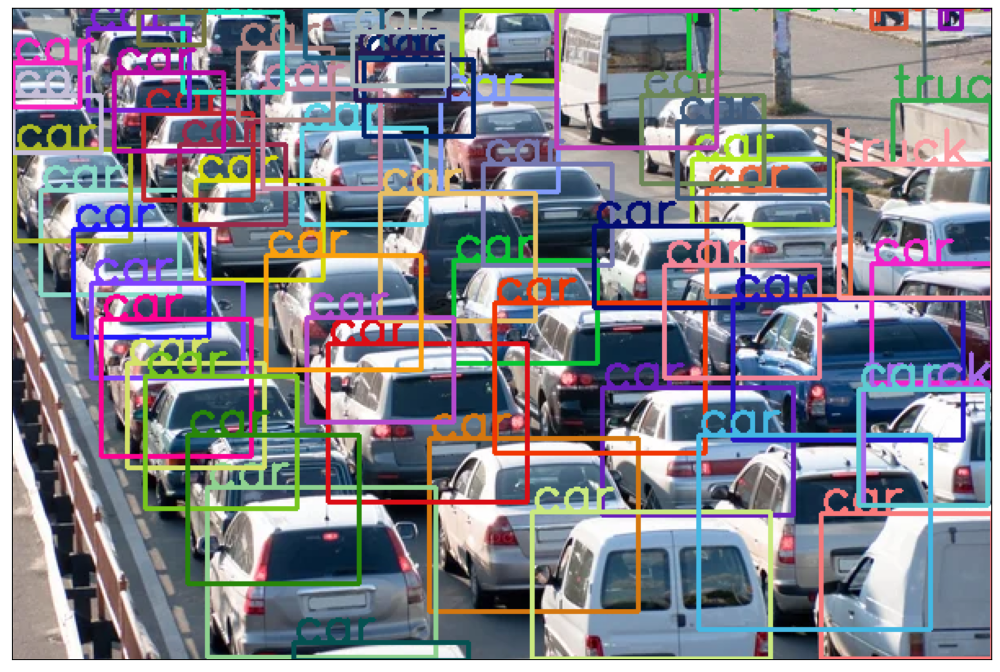

In [17]:
# It found all the cars. Now we can try on a few more images
object_detection('https://static3.depositphotos.com/1000139/106/i/600/depositphotos_1067448-stock-photo-traffic-jam.jpg', 
                     rect_th=2, text_th=2, text_size=1, url=True)

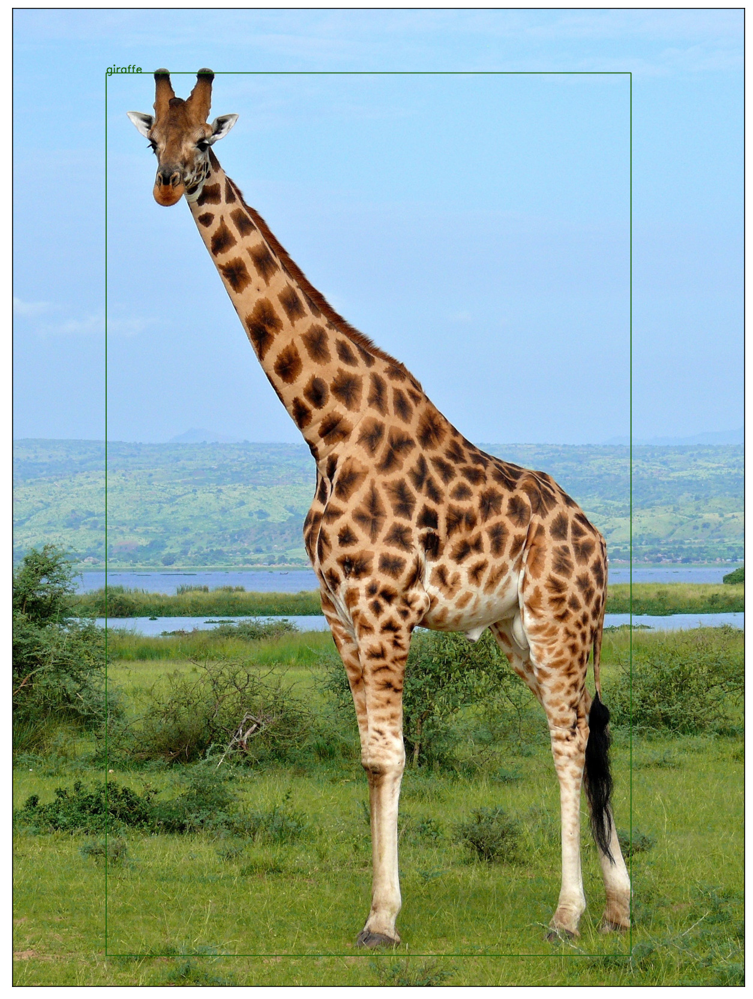

In [18]:
object_detection('https://upload.wikimedia.org/wikipedia/commons/c/c7/Rothschild%27s_Giraffe_%28Giraffa_camelopardalis_rothschildi%29_male_%287068054987%29%2C_crop_%26_edit.jpg', 
                     rect_th=2, text_th=2, text_size=1, url=True)